In [5]:
import os
import pandas as pd
import numpy as np
import re


def dataseq():
    sequences = {}

    folders_with_los = {
        './PeriodicAttack_vehsPerHour_1100/': 'D',
    }
    
    mobility_pattern = re.compile(r'RSUExampleScenario3\.target\[\d+\]\.veinsmobility$')
    appl_pattern = re.compile(r'RSUExampleScenario3\.target\[\d+\]\.appl$')

    for base_path, los in folders_with_los.items():
        print(f"[INFO] Processing folder {base_path} with LOS={los}")
        for dep in range(895, 906):
            folder = os.path.join(base_path, f'depart_{dep}')
            for iter_num in range(1, 31):
                file_path = os.path.join(folder, f'PeriodicAttack_depart_{dep}_iter_{iter_num}_vector.csv')
                if not os.path.exists(file_path):
                    print(f"⚠️ File not found: {file_path}")
                    continue

                try:
                    df = pd.read_csv(file_path)
                except Exception as e:
                    print(f"❌ Error reading {file_path}: {e}")
                    continue

                # Extract anomaly timestamps
                anomaly_times = set()
                anomaly_data = df[
                    (df['type'] == 'vector') &
                    (df['module'].str.match(appl_pattern)) &
                    (df['name'] == 'Target Received Messages Timestamp')
                ]
                for _, row in anomaly_data.iterrows():
                    try:
                        times = [int(float(t)) for t in row['vectime'].split()]
                        values = [int(float(v)) for v in row['vecvalue'].split()]
                        for t, v in zip(times, values):
                            if v == 1:
                                anomaly_times.add(t)
                    except Exception as e:
                        print(f"⚠️ Error parsing anomaly data in {file_path}: {e}")

                # Extract features: speed, posx, posy, acceleration
                features_data = {}
                feature_names = ['speed', 'acceleration']
                for feature in feature_names:
                    feature_rows = df[
                        (df['type'] == 'vector') &
                        (df['module'].str.match(mobility_pattern)) &
                        (df['name'] == feature)
                    ]
                    times_vals = []
                    for _, row in feature_rows.iterrows():
                        try:
                            times = [int(float(t)) for t in row['vectime'].split()]
                            vals = [float(v) for v in row['vecvalue'].split()]
                            if len(times) == len(vals):
                                times_vals.append((times, vals))
                        except Exception as e:
                            print(f"⚠️ Error parsing {feature} data in {file_path}: {e}")

                    # Merge all times/values from multiple rows for this feature
                    all_time_vals = {}
                    for t_list, v_list in times_vals:
                        for t, v in zip(t_list, v_list):
                            if t not in all_time_vals:
                                all_time_vals[t] = v
                    features_data[feature] = all_time_vals

                # Align all times across features
                all_times = set()
                for feature_dict in features_data.values():
                    all_times.update(feature_dict.keys())
                all_times = sorted(all_times)

                if not all_times:
                    print(f"⚠️ No feature data found in {file_path}")
                    continue

                # Build feature matrix (times x features)
                feature_matrix = []
                for t in all_times:
                    row = []
                    for feature in feature_names:
                        row.append(features_data[feature].get(t, 0.0))  # fill missing with 0.0
                    feature_matrix.append(row)

                # Build label vector
                labels = [1 if t in anomaly_times else 0 for t in all_times]

                sequences[(los, dep, iter_num)] = (
                    np.array(all_times, dtype=int),
                    np.array(feature_matrix, dtype=float),
                    np.array(labels, dtype=int)
                )

    if len(sequences) == 0:
        raise RuntimeError("No sequences loaded! Check your data paths and files.")

    print(f"[INFO] Loaded total sequences: {len(sequences)}")
    return sequences
sequences=dataseq()

[INFO] Processing folder ./PeriodicAttack_vehsPerHour_1100/ with LOS=D
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_1_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_2_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_3_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_4_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_5_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_6_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_7_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/PeriodicAttack_depart_895_iter_8_vector.csv
⚠️ File not found: ./PeriodicAttack_vehsPerHour_1100/depart_895/P

RuntimeError: No sequences loaded! Check your data paths and files.

In [2]:
import csv

def save_sequences_to_csv_with_jerk(sequences, output_file='sequence_data_with_jerk.csv'):
    with open(output_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        # Write header
        writer.writerow(['LOS', 'DepartureTime', 'Iteration', 'Time', 'Speed', 'Acceleration', 'Jerk', 'Label'])

        for (los, dep, iter_num), (times, features, labels) in sequences.items():
            for i in range(len(times)):
                speed = features[i][0]
                acceleration = features[i][1]

                # Compute jerk
                if i == 0:
                    jerk = 0.0  # no previous data, so assume jerk is 0
                else:
                    delta_a = features[i][1] - features[i-1][1]
                    delta_t = times[i] - times[i-1]
                    jerk = delta_a / delta_t if delta_t != 0 else 0.0

                row = [
                    los,
                    dep,
                    iter_num,
                    times[i],
                    speed,
                    acceleration,
                    jerk,
                    labels[i]
                ]
                writer.writerow(row)

    print(f"[INFO] Sequence data with jerk written to {output_file}")

# Example usage:
# sequences = dataseq()
save_sequences_to_csv_with_jerk(sequences)


NameError: name 'sequences' is not defined

In [4]:
# sequences = dataseq('./PeriodicAttack_vehsPerHour_500/')

# # Access data for departure 895, iteration 5
# dep, iter = 895, 5
# times, speeds, labels = sequences[(dep, iter)]

# # Get all departure numbers and iteration numbers available
available_sequences = list(sequences.keys())

In [5]:
available_sequences, len(available_sequences)

([('D', 895, 1),
  ('D', 895, 2),
  ('D', 895, 3),
  ('D', 895, 4),
  ('D', 895, 5),
  ('D', 895, 6),
  ('D', 895, 7),
  ('D', 895, 8),
  ('D', 895, 9),
  ('D', 895, 10),
  ('D', 895, 11),
  ('D', 895, 12),
  ('D', 895, 13),
  ('D', 895, 14),
  ('D', 895, 15),
  ('D', 895, 16),
  ('D', 895, 17),
  ('D', 895, 18),
  ('D', 895, 19),
  ('D', 895, 20),
  ('D', 895, 21),
  ('D', 895, 22),
  ('D', 895, 23),
  ('D', 895, 24),
  ('D', 895, 25),
  ('D', 895, 26),
  ('D', 895, 27),
  ('D', 895, 28),
  ('D', 895, 29),
  ('D', 895, 30),
  ('D', 896, 1),
  ('D', 896, 2),
  ('D', 896, 3),
  ('D', 896, 4),
  ('D', 896, 5),
  ('D', 896, 6),
  ('D', 896, 7),
  ('D', 896, 8),
  ('D', 896, 9),
  ('D', 896, 10),
  ('D', 896, 11),
  ('D', 896, 12),
  ('D', 896, 13),
  ('D', 896, 14),
  ('D', 896, 15),
  ('D', 896, 16),
  ('D', 896, 17),
  ('D', 896, 18),
  ('D', 896, 19),
  ('D', 896, 20),
  ('D', 896, 21),
  ('D', 896, 22),
  ('D', 896, 23),
  ('D', 896, 24),
  ('D', 896, 25),
  ('D', 896, 26),
  ('D', 89

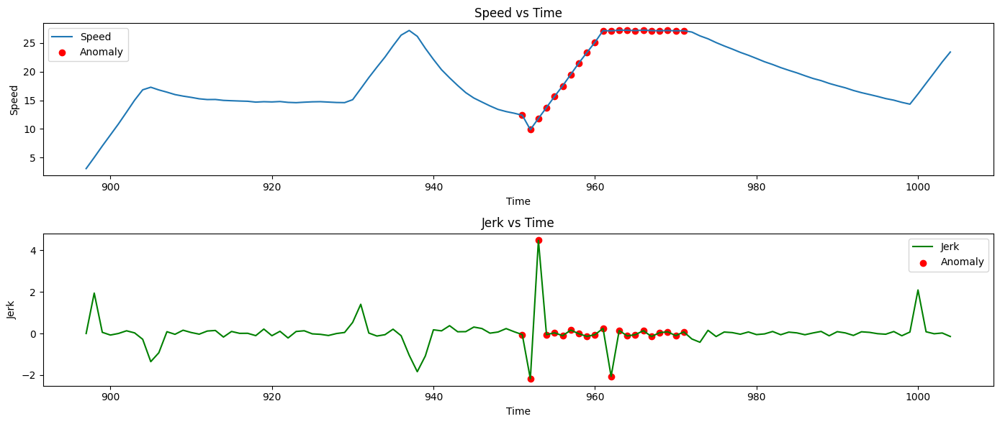

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the saved CSV
df = pd.read_csv('Persistent_losA_Decel_sequence_data_with_jerk.csv')

# Optionally filter for a specific sequence
# For example: LOS='D', DepartureTime=895, Iteration=1
seq_df = df[(df['LOS'] == 'A') & (df['DepartureTime'] == 895) & (df['Iteration'] == 1)]

# Extract variables
times = seq_df['Time'].values
speeds = seq_df['Speed'].values
jerks = seq_df['Jerk'].values
labels = seq_df['Label'].values

# Plot speed
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
plt.plot(times, speeds, label="Speed")
plt.scatter(times[labels == 1], speeds[labels == 1], color='red', label="Anomaly")
plt.title("Speed vs Time")
plt.xlabel("Time")
plt.ylabel("Speed")
plt.legend()

# Plot jerk
plt.subplot(2, 1, 2)
plt.plot(times, jerks, label="Jerk", color='green')
plt.scatter(times[labels == 1], jerks[labels == 1], color='red', label="Anomaly")
plt.title("Jerk vs Time")
plt.xlabel("Time")
plt.ylabel("Jerk")
plt.legend()

plt.tight_layout()
plt.show()


In [4]:
times, f, labels = sequences[available_sequences[24]]
print(len(times) , len(times[labels == 1]), len(times[labels == 0]))

import matplotlib.pyplot as plt

plt.figure(figsize=(14, 4))
plt.plot(times,f[:,0], label="Speed")
plt.scatter(times[labels == 1], f[:,0][labels == 1], color='red', label="Anomaly")
# plt.scatter(times[labels == 0], speeds[labels == 0], color='yellow', label="Non-Anomaly")
plt.title("Labeled Speed-Time Data")
plt.xlabel("Time")
plt.ylabel("Speed")
plt.legend()
plt.show()



NameError: name 'sequences' is not defined

/var/data/python/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 36 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

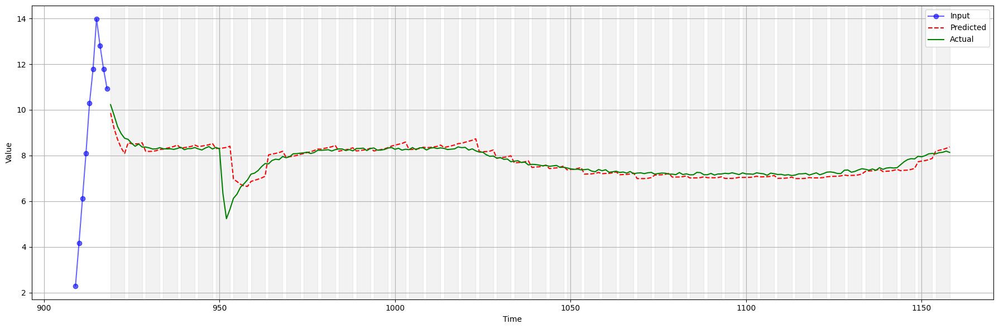


Metrics for Feature: Jerk
True Positives: 21
False Positives: 8
False Negatives: 0
True Negatives: 211
Probability of Detection (PD): 100.00%
False Alarm Rate (FAR): 3.65%
Anomaly Prob: 29/240 (0.12)


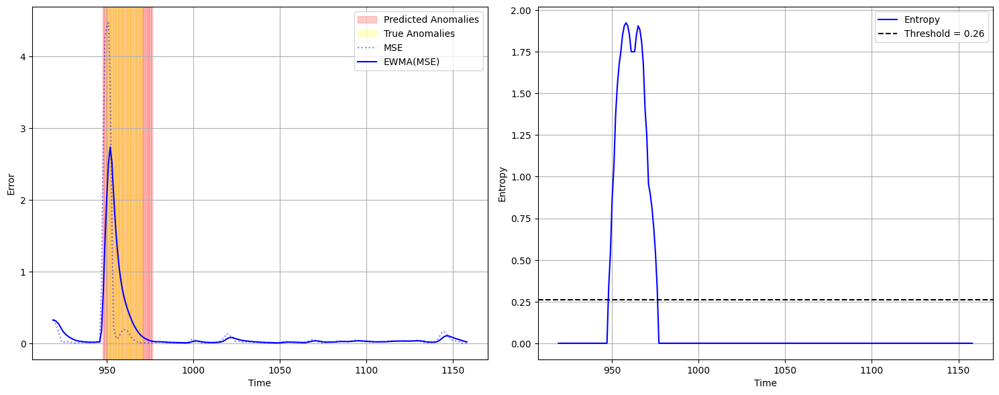

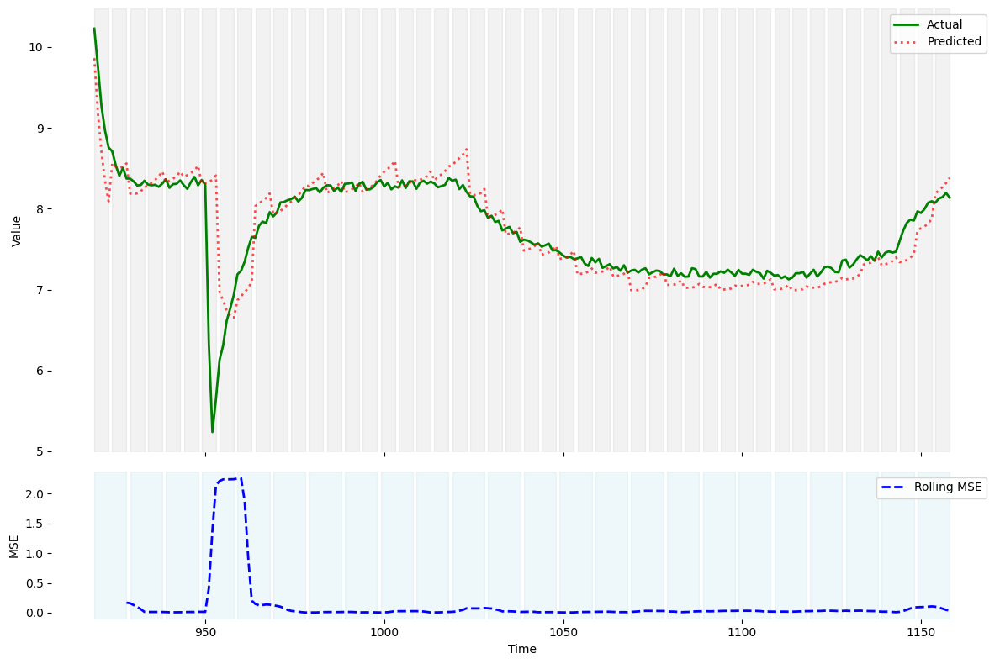

In [8]:
import numpy as np
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv1D, MaxPooling1D, 
                                     LSTM, Bidirectional, Dense, 
                                     Reshape, Dropout, Attention, 
                                     Concatenate, LayerNormalization)
# from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from sklearn.model_selection import train_test_split
from sklearn.metrics import (precision_score, recall_score, 
                             f1_score, confusion_matrix)
# import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.layers import GRU  # Add GRU import
from sklearn.metrics import mean_squared_error
# sns.set_theme(style="ticks")

# def build_prediction_model(input_shape, output_steps, n_features):
#     inputs = Input(shape=input_shape)

#     x = Conv1D(filters=32, kernel_size=3, activation='relu', padding='same')(inputs)
#     x = MaxPooling1D(pool_size=2)(x)
#     x = Bidirectional(LSTM(64, return_sequences=True))(x)

#     attention = Attention()([x, x])  # Self-attention
#     x = Concatenate()([x, attention])
#     x = LayerNormalization()(x)
#     x = Dropout(0.2)(x)

#     x = LSTM(32)(x)
#     x = Dense(64, activation='relu')(x)
#     x = Dense(output_steps * n_features)(x)
#     outputs = Reshape((output_steps, n_features))(x)

#     model = Model(inputs, outputs)
#     model.compile(optimizer=Adam(0.001), loss='mse', metrics=['mae', f1])
#     return model


# def load_trained_model(input_shape, output_steps, n_features):
#     model = build_prediction_model(input_shape, output_steps, n_features)
#     model.load_weights("bilstm.weights.h5")
#     return model


def build_prediction_model(input_shape, output_steps, n_features):
    inputs = Input(shape=input_shape)

    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(64, return_sequences=True))(x)

    attention = Attention()([x, x])  # Self-attention
    x = Concatenate()([x, attention])
    x = LayerNormalization()(x)
    x = Dropout(0.1)(x)

    x = GRU(64)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(output_steps * n_features)(x)
    outputs = Reshape((output_steps, n_features))(x)

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.00093286), loss='mse', metrics=['mae', f1])
    return model

def load_trained_model(input_shape, output_steps, n_features):
    model = build_prediction_model(input_shape, output_steps, n_features)
    model.load_weights("gru_epoch_100_10_5.weights.h5")
    return model


def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        return true_positives / (possible_positives + K.epsilon())

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        return true_positives / (predicted_positives + K.epsilon())

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + K.epsilon()))


def calculate_entropy(data):
    value_counts = np.bincount(data)
    probabilities = value_counts / np.sum(value_counts)
    probabilities = probabilities[probabilities > 0]
    return -np.sum(probabilities * np.log2(probabilities))


def dynthreshold(vectime, vecvalue):
    time_stamps = np.array(vectime)
    packets = np.array(vecvalue)
    packets_int = np.round(packets).astype(int)
    num_points = len(packets_int)

    window_size = 15
    entropy_values = np.array([
        calculate_entropy(packets_int[max(0, i - window_size):i + 1]) for i in range(num_points)
    ])
    H_avg = np.mean(entropy_values)
    sigma = np.std(entropy_values)
    a = 0.2
    T_1 = H_avg + a * sigma
    return entropy_values, T_1, H_avg


def hausdorff_distance(set1, set2):
    dists = cdist(set1, set2, metric='euclidean')
    forward = np.max(np.min(dists, axis=1))
    backward = np.max(np.min(dists, axis=0))
    return max(forward, backward)


# def plot_residuals(prediction, actual_continuation, feature_names, test_labels, time_sequence, look_back=18):
#     if actual_continuation is None:
#         print("Actual continuation is not available, cannot compute residuals.")
#         return

#     def compute_ewma(series, alpha=0.2):
#         ewma = np.zeros_like(series)
#         ewma[0] = series[0]
#         for t in range(1, len(series)):
#             ewma[t] = alpha * series[t] + (1 - alpha) * ewma[t - 1]
#         return ewma

#     def rmse_windowed(y_true, y_pred, window):
#         return np.sqrt(np.mean((y_true - y_pred) ** 2, axis=1))

#     plot_times = time_sequence[look_back:look_back + len(prediction)]
#     plt.figure(figsize=(15, 6))

#     # Define range of 'a' values to test
#     a_values = np.arange(-5, 5, 0.1)
#     results = []

#     for i, feature in enumerate(feature_names):
#         rmse_series = np.array([
#             np.mean((actual_continuation[t:t+window_size, i] - prediction[t:t+window_size, i]) ** 2)
#             if t + window_size <= len(prediction) else 0
#             for t in range(len(prediction))
#         ])
#         smoothed_rmse = compute_ewma(rmse_series)
#         entropy_vals = np.array([
#             calculate_entropy(np.round(smoothed_rmse[max(0, j - window_size):j + 1]).astype(int))
#             for j in range(len(smoothed_rmse))
#         ])
#         H_avg = np.mean(entropy_vals)
#         sigma = np.std(entropy_vals)

#         # Evaluate each 'a' value
#         for a in a_values:
#             T1 = H_avg + a * sigma
#             anomalies = (entropy_vals > T1).astype(int)
#             y_true = test_labels[look_back:look_back + len(prediction)]
#             y_pred = anomalies

#             TP = np.sum((y_pred == 1) & (y_true == 1))
#             FN = np.sum((y_pred == 0) & (y_true == 1))
#             FP = np.sum((y_pred == 1) & (y_true == 0))
#             TN = np.sum((y_pred == 0) & (y_true == 0))

#             PD = (TP / (TP + FN)) if (TP + FN) > 0 else 0.0
#             FAR = (FP / (FP + TN)) if (FP + TN) > 0 else 0.0
#             Youden_index = PD - FAR

#             results.append({
#                 'a': a,
#                 'PD': PD,
#                 'FAR': FAR,
#                 'Youden_index': Youden_index,
#                 'Feature': feature
#             })

#     # Convert results to DataFrame
#     results_df = pd.DataFrame(results)

#     # Get top 10 'a' values across all features (average Youden index)
#     top_a_values = results_df.groupby('a')['Youden_index'].mean().sort_values(ascending=False).head(10)
#     print("Top 10 optimal 'a' values based on Youden index (PD - FAR):")
#     print(top_a_values)

#     # Plot for the best 'a' (e.g., top 1)
#     best_a = top_a_values.index[0]
#     for i, feature in enumerate(feature_names):
#         plt.subplot(len(feature_names), 2, 2 * i + 1)

#         rmse_series = np.array([
#             np.mean((actual_continuation[t:t+window_size, i] - prediction[t:t+window_size, i]) ** 2)
#             if t + window_size <= len(prediction) else 0
#             for t in range(len(prediction))
#         ])
#         smoothed_rmse = compute_ewma(rmse_series)
#         entropy_vals = np.array([
#             calculate_entropy(np.round(smoothed_rmse[max(0, j - window_size):j + 1]).astype(int))
#             for j in range(len(smoothed_rmse))
#         ])
#         T1 = H_avg + best_a * sigma
#         anomalies = (entropy_vals > T1).astype(int)

#         for idx in np.where(anomalies == 1)[0]:
#             plt.axvspan(plot_times[idx] - 0.5, plot_times[idx] + 0.5, color='red', alpha=0.2)

#         true_anomalies_idx = np.where(test_labels[look_back:look_back + len(prediction)] == 1)[0]
#         for idx in true_anomalies_idx:
#             plt.axvspan(plot_times[idx] - 0.5, plot_times[idx] + 0.5, color='yellow', alpha=0.6)

#         y_true = test_labels[look_back:look_back + len(prediction)]
#         y_pred = anomalies

#         TP = np.sum((y_pred == 1) & (y_true == 1))
#         FN = np.sum((y_pred == 0) & (y_true == 1))
#         FP = np.sum((y_pred == 1) & (y_true == 0))
#         TN = np.sum((y_pred == 0) & (y_true == 0))

#         prob_detection = (TP / (TP + FN)) * 100 if (TP + FN) > 0 else 0.0
#         false_alarm_rate = (FP / (FP + TN)) * 100 if (FP + TN) > 0 else 0.0

#         print(f"\nMetrics for Feature: {feature} (a = {best_a:.2f})")
#         print(f"True Positives: {TP}")
#         print(f"False Positives: {FP}")
#         print(f"False Negatives: {FN}")
#         print(f"True Negatives: {TN}")
#         print(f"Probability of Detection (PD): {prob_detection:.2f}%")
#         print(f"False Alarm Rate (FAR): {false_alarm_rate:.2f}%")

#         num_anomalies = np.sum(y_pred == 1)
#         total_points = len(y_pred)
#         anomaly_probability = (num_anomalies / total_points) if total_points > 0 else 0.0

#         print(f"Anomaly Prob: {num_anomalies}/{total_points} ({anomaly_probability:.2f})")

#         plt.plot(plot_times, rmse_series, label='RMSE', color='red', linestyle='dotted', alpha=0.5)
#         plt.plot(plot_times, smoothed_rmse, label='EWMA(RMSE)', color='red')
#         plt.title(f'{feature} RMSE & EWMA - Anomaly Prob = {anomaly_probability:.2f} (a={best_a:.2f})')
#         plt.xlabel('Time')
#         plt.ylabel('Error')
#         plt.legend()
#         plt.grid(True)

#         plt.subplot(len(feature_names), 2, 2 * i + 2)
#         plt.plot(plot_times, entropy_vals, label='Entropy', color='blue')
#         plt.axhline(y=T1, color='black', linestyle='--', label=f'Threshold = {T1:.2f}')
#         plt.axhline(y=H_avg, color='green', linestyle=':', label=f'H_avg = {H_avg:.2f}')
#         plt.title(f'{feature} Entropy of EWMA(RMSE) (a={best_a:.2f})')
#         plt.xlabel('Time')
#         plt.ylabel('Entropy')
#         plt.legend()
#         plt.grid(True)

#     plt.tight_layout()
#     plt.savefig('residuals_rmse_entropy_anomalies.png')
#     plt.show()

def plot_residuals(prediction, actual_continuation, feature_names, test_labels, time_sequence, look_back=18):
    if actual_continuation is None:
        print("Actual continuation is not available, cannot compute residuals.")
        return

    def compute_ewma(series, alpha=0.2):
        ewma = np.zeros_like(series)
        ewma[0] = series[0]
        for t in range(1, len(series)):
            ewma[t] = alpha * series[t] + (1 - alpha) * ewma[t - 1]
        return ewma

    def rmse_windowed(y_true, y_pred, window):
        return np.sqrt(np.mean((y_true - y_pred) ** 2, axis=1))

    plot_times = time_sequence[look_back:look_back + len(prediction)]
    plt.figure(figsize=(15, 6))

    for i, feature in enumerate(feature_names):
        plt.subplot(len(feature_names), 2, 2 * i + 1)

        window_size = 5
        rmse_series = np.array([
            np.mean((actual_continuation[t:t+window_size, i] - prediction[t:t+window_size, i]) ** 2)
            if t + window_size <= len(prediction) else 0
            for t in range(len(prediction))
        ])

        smoothed_rmse = compute_ewma(rmse_series)
        entropy_vals, T1, H_avg = dynthreshold(plot_times, smoothed_rmse)
        anomalies = (entropy_vals > T1).astype(int)

        for idx in np.where(anomalies == 1)[0]:
            plt.axvspan(plot_times[idx] - 0.5, plot_times[idx] + 0.5, color='red', alpha=0.2)

        true_anomalies_idx = np.where(test_labels[look_back:look_back + len(prediction)] == 1)[0]
        for idx in true_anomalies_idx:
            plt.axvspan(plot_times[idx] - 0.5, plot_times[idx] + 0.5, color='yellow', alpha=0.2)

        y_true = test_labels[look_back:look_back + len(prediction)]
        y_pred = anomalies

        TP = np.sum((y_pred == 1) & (y_true == 1))
        FN = np.sum((y_pred == 0) & (y_true == 1))
        FP = np.sum((y_pred == 1) & (y_true == 0))
        TN = np.sum((y_pred == 0) & (y_true == 0))

        prob_detection = (TP / (TP + FN)) * 100 if (TP + FN) > 0 else 0.0
        false_alarm_rate = (FP / (FP + TN)) * 100 if (FP + TN) > 0 else 0.0

        print(f"\nMetrics for Feature: {feature}")
        print(f"True Positives: {TP}")
        print(f"False Positives: {FP}")
        print(f"False Negatives: {FN}")
        print(f"True Negatives: {TN}")
        print(f"Probability of Detection (PD): {prob_detection:.2f}%")
        print(f"False Alarm Rate (FAR): {false_alarm_rate:.2f}%")

        num_anomalies = np.sum(y_pred == 1)
        total_points = len(y_pred)
        anomaly_probability = (num_anomalies / total_points) if total_points > 0 else 0.0

        print(f"Anomaly Prob: {num_anomalies}/{total_points} ({anomaly_probability:.2f})")

        plt.plot(plot_times, rmse_series, label='MSE', color='blue', linestyle='dotted', alpha=0.5)
        plt.plot(plot_times, smoothed_rmse, label='EWMA(MSE)', color='blue')
        # plt.title(f'{feature} RMSE & EWMA - Anomaly Prob = {anomaly_probability:.2f}')
        import matplotlib.patches as mpatches
        pred_patch = mpatches.Patch(color='red', alpha=0.2, label='Predicted Anomalies')
        true_patch = mpatches.Patch(color='yellow', alpha=0.2, label='True Anomalies')
        plt.xlabel('Time')
        plt.ylabel('Error')
        # plt.legend()
        plt.legend(handles=[pred_patch, true_patch] + plt.gca().get_legend_handles_labels()[0])

        plt.grid(True)

        plt.subplot(len(feature_names), 2, 2 * i + 2)
        plt.plot(plot_times, entropy_vals, label='Entropy', color='blue')
        plt.axhline(y=T1, color='black', linestyle='--', label=f'Threshold = {T1:.2f}')
        # plt.axhline(y=H_avg, color='green', linestyle=':', label=f'H_avg = {H_avg:.2f}')
        # plt.title(f'{feature} Entropy of EWMA(RMSE)')
        plt.xlabel('Time')
        plt.ylabel('Entropy')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.savefig('residuals_rmse_entropy_anomalies.png')
    plt.show()



def test_single_sequence(model, input_sequence):
    input_seq = np.expand_dims(input_sequence, axis=0)
    prediction = model.predict(input_seq)[0]
    return prediction


def plot_test_results(input_sequence, prediction, actual_continuation, labels, feature_names, time_sequence):
    look_back = input_sequence.shape[0]
    look_forward = prediction.shape[0]
    full_times = time_sequence[:look_back + look_forward]

    plt.figure(figsize=(15, 6))

    for i, feature in enumerate(feature_names):
        plt.subplot(1, len(feature_names), i+1)

        plt.plot(full_times[:look_back], input_sequence[:, i], 'b-o', label='Input')
        plt.plot(full_times[look_back:look_back + look_forward], prediction[:, i], 'r--o', label='Prediction')

        if actual_continuation is not None:
            plt.plot(full_times[look_back:look_back + look_forward], actual_continuation[:, i], 'g-o', label='Actual')

        input_anomalies = np.where(labels[:look_back] == 1)[0]
        for idx in input_anomalies:
            plt.axvspan(full_times[idx] - 0.5, full_times[idx] + 0.5, color='red', alpha=0.2)

        continuation_anomalies = np.where(labels[look_back:look_back + look_forward] == 1)[0]
        for idx in continuation_anomalies:
            plt.axvspan(full_times[look_back + idx] - 0.5, full_times[look_back + idx] + 0.5, color='red', alpha=0.2)

        plt.title(f'{feature} Prediction vs Actual')
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.legend()
        plt.grid(True)

    plt.tight_layout()
    plt.savefig('prediction_vs_actual.png')
    plt.show()

def rolling_rmse(actual, predicted, window_size):
    rmse = np.full_like(actual, np.nan, dtype=np.float64)
    for i in range(window_size - 1, len(actual)):
        rmse[i] = (mean_squared_error(actual[i - window_size + 1:i + 1],
                                             predicted[i - window_size + 1:i + 1]))
    return rmse

def plot_overlay_with_rmse_residuals(time, actual, predicted, feature_name="Feature", rmse_window=10, prediction_window=10):
    residual_rmse = rolling_rmse(actual, predicted, rmse_window)

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True,
                                   gridspec_kw={'height_ratios': [3, 1]})

    # Plot Actual and Predicted
    ax1.plot(time, actual, label='Actual', color='green', linewidth=2)
    ax1.plot(time, predicted, label='Predicted', color='red',linestyle='dotted', alpha=0.7, linewidth=2)

    # Shade prediction windows (gray)
    for start in range(0, len(time), prediction_window):
        end = min(start + prediction_window, len(time))
        ax1.axvspan(time[start], time[end - 1], color='gray', alpha=0.1)

    # Shade RMSE windows (light blue)
    for start in range(rmse_window - 1, len(time), rmse_window):
        end = min(start + 1, len(time))  # Single point RMSE computed at this time
        ax2.axvspan(time[start - rmse_window + 1], time[start], color='lightblue', alpha=0.2)

    ax1.set_ylabel("Value")
    ax1.legend()

    # Plot RMSE Residual
    ax2.plot(time, residual_rmse, label=f'Rolling MSE', color='blue', linestyle='--', linewidth=2)
    ax2.set_xlabel("Time")
    ax2.set_ylabel("MSE")
    ax2.legend()

    # Remove all borders and grid
    for ax in [ax1, ax2]:
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.tick_params(top=False, right=False)
        ax.grid(False)

    plt.tight_layout()
    plt.savefig('overlay_with_rmse_and_prediction_windows.png')
    plt.show()


# ---------------------- MAIN ----------------------
if __name__ == "__main__":
    # Load the CSV
    df = pd.read_csv('All_LOS_DATA_decel_sequence_data_with_jerk.csv')

    # Filter sequence if needed (e.g., LOS, DepartureTime, Iteration)
    seq_df = df[(df['LOS'] == 'E') & (df['DepartureTime'] == 905) & (df['Iteration'] == 17)]  # <-- apply filters if necessary

    # Extract features, labels, and time
    time_sequence = seq_df['Time'].values
    full_features = seq_df[['Speed','Acceleration','Jerk']].values
    full_labels = seq_df['Label'].values.astype(int)
    feature_names = ['Jerk'] #['Speed','Acceleration','Jerk']

    # Verify shape consistency
    if full_features.shape[1] != 3:
        raise ValueError(f"Expected 3 features, got {full_features.shape[1]}. Ensure you're using ['Speed', 'Acceleration', 'Jerk'].")

    # Parameters
    look_back = 10
    look_forward = 5
    n_features = 3

    model = load_trained_model(
        input_shape=(look_back, n_features),
        output_steps=look_forward,
        n_features=n_features
    )

    # Initialize variables for storing predictions
    all_predictions = []
    all_actuals = []
    all_times = []

    # Loop through the sequence with sliding window
    for i in range(0, len(full_features) - look_back - look_forward + 1, look_forward):
        # Get current window
        current_window = full_features[i:i+look_back]
        actual_continuation = full_features[i+look_back:i+look_back+look_forward]
        time_window = time_sequence[i+look_back:i+look_back+look_forward]
        
        # Make prediction
        prediction = test_single_sequence(model, current_window)
        
        # Store results
        all_predictions.append(prediction)
        all_actuals.append(actual_continuation)
        all_times.append(time_window)

    # Convert lists to numpy arrays
    all_predictions = np.concatenate(all_predictions)
    all_actuals = np.concatenate(all_actuals)
    all_times = np.concatenate(all_times)

    # Create full predicted sequence (initial input + predictions)
    predicted_sequence = np.vstack([full_features[:look_back], all_predictions])
    actual_sequence = np.vstack([full_features[:look_back], all_actuals])
    time_plot = np.concatenate([time_sequence[:look_back], all_times])

    # ---- Plotting ----
    plt.figure(figsize=(18, 6))

    for i, feature in enumerate(feature_names):
        plt.subplot(1, len(feature_names), i + 1)
        
        plt.plot(time_plot[:look_back], predicted_sequence[:look_back, i], 'b-o', label='Input', alpha=0.6)
        plt.plot(time_plot[look_back:], predicted_sequence[look_back:, i], 'r--', label='Predicted')
        plt.plot(time_plot[look_back:], actual_sequence[look_back:, i], 'g-', label='Actual')
        
        # Mark prediction windows
        for j in range(look_back, len(time_plot), look_forward):
            end = min(j + look_forward, len(time_plot))
            plt.axvspan(time_plot[j], time_plot[end-1], color='gray', alpha=0.1)
        
        # plt.title(f'{feature}: Prediction vs Actual (Window size: {look_back}→{look_forward})')
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.grid(True)
        plt.legend()

    plt.tight_layout()
    plt.savefig('windowed_prediction_vs_actual.png')
    plt.show()

    # Slice matching labels
    test_labels = full_labels[:predicted_sequence.shape[0]]

    # Plot anomaly detection and print metrics
    plot_residuals(
        prediction=predicted_sequence[look_back:], 
        actual_continuation=actual_sequence[look_back:], 
        feature_names=feature_names,
        test_labels=test_labels,
        time_sequence=time_plot,
        look_back=look_back
    )

    # Plot overlay with RMSE for each feature
    for i, feature_name in enumerate(feature_names):
        plot_overlay_with_rmse_residuals(
            time=time_plot[look_back:], 
            actual=actual_sequence[look_back:, i], 
            predicted=predicted_sequence[look_back:, i],
            feature_name=feature_name,
            rmse_window=10,
            prediction_window=look_forward
        )

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Bidirectional, Dense, Reshape, Dropout, Attention, Concatenate, LayerNormalization, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from sklearn.metrics import confusion_matrix, roc_auc_score, f1_score
from scipy.spatial.distance import cdist

# ---------------------- Model Definition ----------------------

def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        return true_positives / (possible_positives + K.epsilon())

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        return true_positives / (predicted_positives + K.epsilon())

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + K.epsilon()))

def build_prediction_model(input_shape, output_steps, n_features):
    inputs = Input(shape=input_shape)

    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(64, return_sequences=True))(x)

    attention = Attention()([x, x])  # Self-attention
    x = Concatenate()([x, attention])
    x = LayerNormalization()(x)
    x = Dropout(0.1)(x)

    x = GRU(64)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(output_steps * n_features)(x)
    outputs = Reshape((output_steps, n_features))(x)

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.00093286), loss='mse', metrics=['mae', f1])
    return model

def load_trained_model(input_shape, output_steps, n_features):
    model = build_prediction_model(input_shape, output_steps, n_features)
    model.load_weights("gru_epoch_100_10_5.weights.h5")
    return model

# ---------------------- Helper Functions ----------------------

def calculate_entropy(data):
    value_counts = np.bincount(data)
    probabilities = value_counts / np.sum(value_counts)
    probabilities = probabilities[probabilities > 0]
    return -np.sum(probabilities * np.log2(probabilities))

def dynthreshold(vectime, vecvalue):
    packets_int = np.round(vecvalue).astype(int)
    num_points = len(packets_int)
    window_size = 15
    entropy_values = np.array([
        calculate_entropy(packets_int[max(0, i - window_size):i + 1]) for i in range(num_points)
    ])
    H_avg = np.mean(entropy_values)
    sigma = np.std(entropy_values)
    a = 0.2
    T_1 = H_avg + a * sigma
    return entropy_values, T_1, H_avg

def test_single_sequence(model, input_sequence):
    input_seq = np.expand_dims(input_sequence, axis=0)
    prediction = model.predict(input_seq)[0]
    return prediction

def compute_ewma(series, alpha=0.2):
        ewma = np.zeros_like(series)
        ewma[0] = series[0]
        for t in range(1, len(series)):
            ewma[t] = alpha * series[t] + (1 - alpha) * ewma[t - 1]
        return ewma

# ---------------------- Main Processing ----------------------

if __name__ == "__main__":
    df = pd.read_csv('Persistent_losA_Decel_sequence_data_with_jerk.csv')

    look_back = 10
    look_forward = 5
    n_features = 3
    feature_names = ['Speed', 'Acceleration', 'Jerk']
    target_feature = 'Jerk'

    model = load_trained_model(
        input_shape=(look_back, n_features),
        output_steps=look_forward,
        n_features=n_features
    )

    sequences = df[['LOS', 'DepartureTime', 'Iteration']].drop_duplicates()
    metrics_summary = []

    for idx, row in sequences.iterrows():
        start_time = time.time()

        los = row['LOS']
        departure_time = row['DepartureTime']
        iteration = row['Iteration']
        print(los, departure_time, iteration)
        seq_df = df[(df['LOS'] == los) & (df['DepartureTime'] == departure_time) & (df['Iteration'] == iteration)]
        if len(seq_df) < (look_back + look_forward):
            continue

        time_sequence = seq_df['Time'].values
        full_features = seq_df[['Speed', 'Acceleration', 'Jerk']].values
        full_labels = seq_df['Label'].values.astype(int)

        all_predictions, all_actuals, all_times, all_labels = [], [], [], []

        for i in range(0, len(full_features) - look_back - look_forward + 1, look_forward):
            current_window = full_features[i:i+look_back]
            actual_continuation = full_features[i+look_back:i+look_back+look_forward]
            time_window = time_sequence[i+look_back:i+look_back+look_forward]
            label_window = full_labels[i+look_back:i+look_back+look_forward]
            prediction = test_single_sequence(model, current_window)
            all_predictions.append(prediction)
            all_actuals.append(actual_continuation)
            all_times.append(time_window)
            all_labels.append(label_window)

        if not all_predictions:
            continue

        all_predictions = np.concatenate(all_predictions)
        all_actuals = np.concatenate(all_actuals)
        all_times = np.concatenate(all_times)
        all_labels = np.concatenate(all_labels)

        predicted_sequence = np.vstack([full_features[:look_back], all_predictions])
        actual_sequence = np.vstack([full_features[:look_back], all_actuals])
        time_plot = np.concatenate([time_sequence[:look_back], all_times])
        test_labels = np.concatenate([full_labels[:look_back], all_labels])

        feature_idx = feature_names.index(target_feature)
        window_size = 10
        mse_series = np.array([
            np.mean((actual_sequence[t:t+window_size, feature_idx] - predicted_sequence[t:t+window_size, feature_idx]) ** 2)
            if t + window_size <= len(predicted_sequence) else 0
            for t in range(len(predicted_sequence))
        ])

        smoothed_mse = compute_ewma(mse_series[look_back:])
        entropy_vals, T1, H_avg = dynthreshold(time_plot[look_back:], smoothed_mse)
        anomalies = (entropy_vals > T1).astype(int)

        y_true = test_labels[look_back:look_back+len(smoothed_mse)]
        y_pred = anomalies

        TP = np.sum((y_pred == 1) & (y_true == 1))
        FP = np.sum((y_pred == 1) & (y_true == 0))
        FN = np.sum((y_pred == 0) & (y_true == 1))
        TN = np.sum((y_pred == 0) & (y_true == 0))

        try:
            auc = roc_auc_score(y_true, entropy_vals)
        except ValueError:
            auc = np.nan

        f1_val = f1_score(y_true, y_pred, zero_division=0)
        prob_detection = (TP / (TP + FN)) * 100 if (TP + FN) > 0 else 0.0
        false_alarm_rate = (FP / (FP + TN)) * 100 if (FP + TN) > 0 else 0.0
        anomaly_probability = (np.sum(y_pred == 1) / len(y_pred)) if len(y_pred) > 0 else 0.0

        end_time = time.time()

        metrics_summary.append({
            'LOS': los,
            'DepartureTime': departure_time,
            'Iteration': iteration,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'PD': prob_detection,
            'FAR': false_alarm_rate,
            'F1': f1_val,
            'AUC': auc,
            'Anomaly_Prob': anomaly_probability,
            'Time_sec': end_time - start_time
        })

    if metrics_summary:
        metrics_df = pd.DataFrame(metrics_summary)
        numeric_cols = metrics_df.select_dtypes(include=np.number).columns
        median_metrics = metrics_df[numeric_cols].median()
        mean_metrics = metrics_df[numeric_cols].mean()

        print(f"\n=== Summary Metrics for Feature: {target_feature} ===")
        print(f"Window Configuration: look_back={look_back}, look_forward={look_forward}")
        print(f"Total sequences analyzed: {len(metrics_df)}")

        print("\nMedian Metrics:")
        print(median_metrics.round(4))

        print("\nMean Metrics:")
        print(mean_metrics.round(4))
    else:
        print(f"No metrics collected for feature: {target_feature}")


/var/data/python/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 36 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


A 895 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
A 895 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/

/var/data/python/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
A 895 22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Bidirectional, Dense, Reshape, Dropout, Attention, Concatenate, LayerNormalization, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from sklearn.metrics import confusion_matrix, roc_auc_score, f1_score
from scipy.spatial.distance import cdist

# ---------------------- Model Definition ----------------------

def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        return true_positives / (possible_positives + K.epsilon())

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        return true_positives / (predicted_positives + K.epsilon())

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + K.epsilon()))

def build_prediction_model(input_shape, output_steps, n_features):
    inputs = Input(shape=input_shape)

    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(64, return_sequences=True))(x)

    attention = Attention()([x, x])  # Self-attention
    x = Concatenate()([x, attention])
    x = LayerNormalization()(x)
    x = Dropout(0.1)(x)

    x = GRU(64)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(output_steps * n_features)(x)
    outputs = Reshape((output_steps, n_features))(x)

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.00093286), loss='mse', metrics=['mae', f1])
    return model

def load_trained_model(input_shape, output_steps, n_features):
    model = build_prediction_model(input_shape, output_steps, n_features)
    model.load_weights("gru_epoch_100_10_5.weights.h5")
    return model

# ---------------------- Helper Functions ----------------------

def calculate_entropy(data):
    value_counts = np.bincount(data)
    probabilities = value_counts / np.sum(value_counts)
    probabilities = probabilities[probabilities > 0]
    return -np.sum(probabilities * np.log2(probabilities))

def dynthreshold(vectime, vecvalue):
    packets_int = np.round(vecvalue).astype(int)
    num_points = len(packets_int)
    window_size = 15
    entropy_values = np.array([
        calculate_entropy(packets_int[max(0, i - window_size):i + 1]) for i in range(num_points)
    ])
    H_avg = np.mean(entropy_values)
    sigma = np.std(entropy_values)
    a = 0.2
    T_1 = H_avg + a * sigma
    return entropy_values, T_1, H_avg

def test_single_sequence(model, input_sequence):
    input_seq = np.expand_dims(input_sequence, axis=0)
    prediction = model.predict(input_seq)[0]
    return prediction

def compute_ewma(series, alpha=0.2):
    ewma = np.zeros_like(series)
    ewma[0] = series[0]
    for t in range(1, len(series)):
        ewma[t] = alpha * series[t] + (1 - alpha) * ewma[t - 1]
    return ewma

# ---------------------- Main Processing ----------------------

if __name__ == "__main__":
    df = pd.read_csv('All_LOS_DATA_decel_sequence_data_with_jerk.csv')

    look_back = 10
    look_forward = 5
    n_features = 3
    feature_names = ['Speed', 'Acceleration', 'Jerk']
    target_feature = 'Jerk'

    model = load_trained_model(
        input_shape=(look_back, n_features),
        output_steps=look_forward,
        n_features=n_features
    )

    sequences = df[['LOS', 'DepartureTime', 'Iteration']].drop_duplicates()
    metrics_summary = []

    for idx, row in sequences.iterrows():
        start_time = time.time()

        los = row['LOS']
        departure_time = row['DepartureTime']
        iteration = row['Iteration']
        print(los, departure_time, iteration)
        seq_df = df[(df['LOS'] == los) & (df['DepartureTime'] == departure_time) & (df['Iteration'] == iteration)]
        if len(seq_df) < (look_back + look_forward):
            continue

        time_sequence = seq_df['Time'].values
        full_features = seq_df[['Speed', 'Acceleration', 'Jerk']].values
        full_labels = seq_df['Label'].values.astype(int)

        all_predictions, all_actuals, all_times, all_labels = [], [], [], []

        for i in range(0, len(full_features) - look_back - look_forward + 1, look_forward):
            current_window = full_features[i:i+look_back]
            actual_continuation = full_features[i+look_back:i+look_back+look_forward]
            time_window = time_sequence[i+look_back:i+look_back+look_forward]
            label_window = full_labels[i+look_back:i+look_back+look_forward]
            prediction = test_single_sequence(model, current_window)
            all_predictions.append(prediction)
            all_actuals.append(actual_continuation)
            all_times.append(time_window)
            all_labels.append(label_window)

        if not all_predictions:
            continue

        all_predictions = np.concatenate(all_predictions)
        all_actuals = np.concatenate(all_actuals)
        all_times = np.concatenate(all_times)
        all_labels = np.concatenate(all_labels)

        predicted_sequence = np.vstack([full_features[:look_back], all_predictions])
        actual_sequence = np.vstack([full_features[:look_back], all_actuals])
        time_plot = np.concatenate([time_sequence[:look_back], all_times])
        test_labels = np.concatenate([full_labels[:look_back], all_labels])

        feature_idx = feature_names.index(target_feature)
        window_size = 10
        mse_series = np.array([
            np.mean((actual_sequence[t:t+window_size, feature_idx] - predicted_sequence[t:t+window_size, feature_idx]) ** 2)
            if t + window_size <= len(predicted_sequence) else 0
            for t in range(len(predicted_sequence))
        ])

        smoothed_mse = compute_ewma(mse_series[look_back:])
        entropy_vals, T1, H_avg = dynthreshold(time_plot[look_back:], smoothed_mse)
        anomalies = (entropy_vals > T1).astype(int)

        y_true = test_labels[look_back:look_back+len(smoothed_mse)]
        y_pred = anomalies

        TP = np.sum((y_pred == 1) & (y_true == 1))
        FP = np.sum((y_pred == 1) & (y_true == 0))
        FN = np.sum((y_pred == 0) & (y_true == 1))
        TN = np.sum((y_pred == 0) & (y_true == 0))

        try:
            auc = roc_auc_score(y_true, entropy_vals)
        except ValueError:
            auc = np.nan

        f1_val = f1_score(y_true, y_pred, zero_division=0)
        prob_detection = (TP / (TP + FN)) * 100 if (TP + FN) > 0 else 0.0
        false_alarm_rate = (FP / (FP + TN)) * 100 if (FP + TN) > 0 else 0.0
        anomaly_probability = (np.sum(y_pred == 1) / len(y_pred)) if len(y_pred) > 0 else 0.0

        end_time = time.time()

        metrics_summary.append({
            'LOS': los,
            'DepartureTime': departure_time,
            'Iteration': iteration,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'PD': prob_detection,
            'FAR': false_alarm_rate,
            'F1': f1_val,
            'AUC': auc,
            'Anomaly_Prob': anomaly_probability,
            'Time_sec': end_time - start_time
        })

        if metrics_summary:
            metrics_df = pd.DataFrame(metrics_summary)
            numeric_cols = metrics_df.select_dtypes(include=np.number).columns

            print(f"\n=== Summary Metrics for Feature: {target_feature} ===")
            print(f"Window Configuration: look_back={look_back}, look_forward={look_forward}")
            print(f"Total sequences analyzed: {len(metrics_df)}\n")

            grouped = metrics_df.groupby('LOS')[numeric_cols]

            print("Median Metrics by LOS:")
            print(grouped.median().round(4))

            print("\nMean Metrics by LOS:")
            print(grouped.mean().round(4))
        else:
            print(f"No metrics collected for feature: {target_feature}")


/var/data/python/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 36 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


A 895 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

=== Summary Metrics for Feature: Jerk ===
Window Configuration: look_back=10, look_forward=5
Total sequences analyzed: 1

Median Metrics by LOS:
     DepartureTime  Iteration    TP    FP   FN    TN     PD      FAR      F1  \
LOS                                        

/var/data/python/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

=== Summary Metrics for Feature: Jerk ===
Window Configuration: look_back=10, look_forward=5
Total sequences analyzed: 21

Median Metrics by LOS:
     DepartureTime  Iteration    TP   FP   FN    TN       PD     FAR      F1  \
LOS                                                                            
A            895.0       11.0  20.0  7.0  1.0  

/var/data/python/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

=== Summary Metrics for Feature: Jerk ===
Window Configuration: look_back=10, look_forward=5
Total sequences analyzed: 588

Median Metrics by LOS:
     DepartureTime  Iteration    TP    FP   FN    TN       PD      FAR  \
LOS                                                                      
A            900.0  

/var/data/python/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

/var/data/python/lib/python3.12/site-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

/var/data/python/lib/python3.12/site-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 36 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Processing LOS A, Departure 895, Iteration 1
Processing LOS A, Departure 895, Iteration 2
Processing LOS A, Departure 895, Iteration 3
Processing LOS A, Departure 895, Iteration 4
Processing LOS A, Departure 895, Iteration 5
Processing LOS A, Departure 895, Iteration 6
Processing LOS A, Departure 895, Iteration 7
Processing LOS A, Departure 895, Iteration 8
Processing LOS A, Departure 895, Iteration 9
Processing LOS A, Departure 895, Iteration 10
Processing LOS A, Departure 895, Iteration 11
Processing LOS A, Departure 895, Iteration 12
Processing LOS A, Departure 895, Iteration 13
Processing LOS A, Departure 895, Iteration 14
Processing LOS A, Departure 895, Iteration 15
Processing LOS A, Departure 895, Iteration 16
Processing LOS A, Departure 895, Iteration 17
Processing LOS A, Departure 895, Iteration 18
Processing LOS A, Departure 895, Iteration 19
Processing LOS A, Departure 895, Iteration 20
Processing LOS A, Departure 895, Iteration 21
Processing LOS A, Departure 895, Iteration 

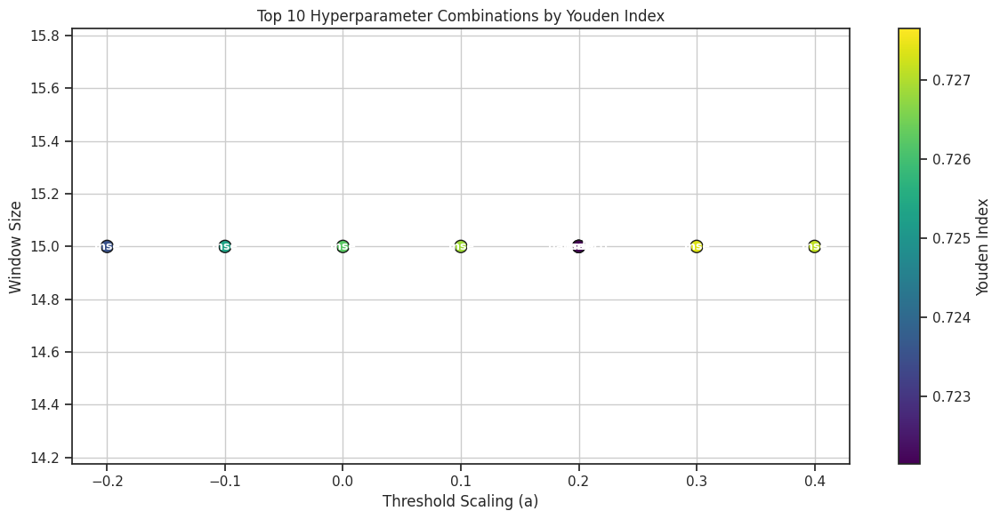

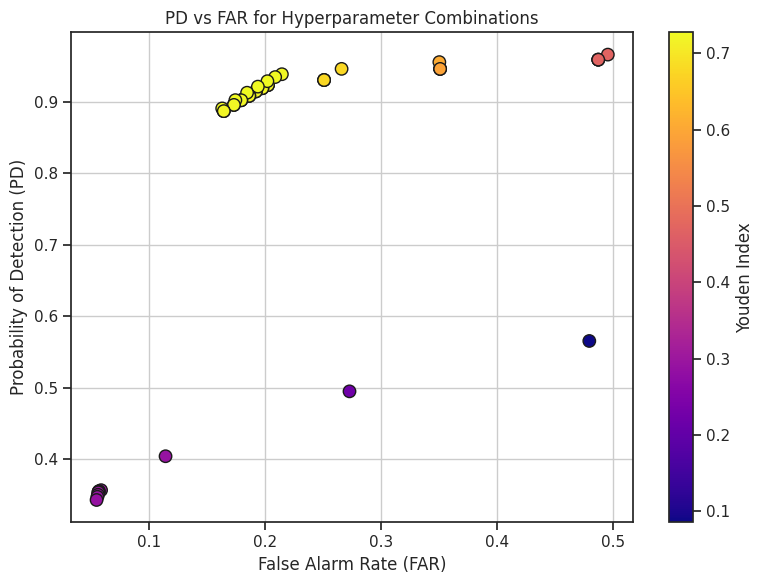


Top 10 global parameter combinations (across all sequences):
               a  window_size  loss_func        PD       FAR  Youden_index
38  2.000000e-01           15        mse  0.912430  0.184784      0.727646
43  3.000000e-01           15        mse  0.902059  0.174698      0.727361
48  4.000000e-01           15        mse  0.890466  0.163353      0.727113
33  1.000000e-01           15        mse  0.920942  0.194086      0.726856
28 -1.110223e-16           15        mse  0.928544  0.202304      0.726240
23 -1.000000e-01           15        mse  0.934310  0.208984      0.725326
18 -2.000000e-01           15        mse  0.938310  0.214767      0.723543
35  2.000000e-01           15  hausdorff  0.901920  0.179775      0.722146
39  2.000000e-01           15       rmse  0.901920  0.179775      0.722146
37  2.000000e-01           15        mae  0.901920  0.179775      0.722146


In [54]:
import numpy as np
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Conv1D, MaxPooling1D, 
                                     GRU, Bidirectional, Dense, 
                                     Reshape, Dropout, Attention, 
                                     Concatenate, LayerNormalization)
from tensorflow.keras import backend as K
from sklearn.metrics import mean_absolute_error, mean_squared_error

# --- Plotting functions ---
def plot_optimization_results(agg_results, top_n=10):
    top = agg_results.sort_values(by='Youden_index', ascending=False).head(top_n)
    plt.figure(figsize=(12, 6))
    scatter = plt.scatter(top['a'], top['window_size'],
                          c=top['Youden_index'], cmap='viridis', s=100, edgecolor='k')
    plt.colorbar(scatter, label='Youden Index')
    for i, row in top.iterrows():
        plt.text(row['a'], row['window_size'], row['loss_func'], fontsize=9,
                 ha='center', va='center', color='white', weight='bold')
    plt.title(f'Top {top_n} Hyperparameter Combinations by Youden Index')
    plt.xlabel('Threshold Scaling (a)')
    plt.ylabel('Window Size')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_pd_vs_far(agg_results):
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(agg_results['FAR'], agg_results['PD'],
                          c=agg_results['Youden_index'], cmap='plasma', s=80, edgecolor='k')
    plt.colorbar(scatter, label='Youden Index')
    plt.title('PD vs FAR for Hyperparameter Combinations')
    plt.xlabel('False Alarm Rate (FAR)')
    plt.ylabel('Probability of Detection (PD)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- Model definition ---
def build_prediction_model(input_shape, output_steps, n_features):
    inputs = Input(shape=input_shape)
    x = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2)(x)
    x = Bidirectional(GRU(64, return_sequences=True))(x)
    attention = Attention()([x, x])
    x = Concatenate()([x, attention])
    x = LayerNormalization()(x)
    x = Dropout(0.1)(x)
    x = GRU(64)(x)
    x = Dense(64, activation='relu')(x)
    x = Dense(output_steps * n_features)(x)
    outputs = Reshape((output_steps, n_features))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.00093286), loss='mse', metrics=['mae', f1])
    return model

def load_trained_model(input_shape, output_steps, n_features):
    model = build_prediction_model(input_shape, output_steps, n_features)
    model.load_weights("gru_epoch_100_10_5.weights.h5")  # make sure this file exists
    return model

# --- Custom metric ---
def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        return true_positives / (possible_positives + K.epsilon())

    def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        return true_positives / (predicted_positives + K.epsilon())

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return 2 * ((p * r) / (p + r + K.epsilon()))

# --- Utility functions ---
def calculate_entropy(data):
    value_counts = np.bincount(data)
    probabilities = value_counts / np.sum(value_counts)
    probabilities = probabilities[probabilities > 0]
    return -np.sum(probabilities * np.log2(probabilities))

def hausdorff_distance(set1, set2):
    dists = cdist(set1, set2, metric='euclidean')
    forward = np.max(np.min(dists, axis=1))
    backward = np.max(np.min(dists, axis=0))
    return max(forward, backward)

def compute_residuals(y_true, y_pred, loss_type='rmse'):
    if loss_type == 'rmse':
        return np.sqrt(np.mean((y_true - y_pred) ** 2, axis=1))
    elif loss_type == 'mse':
        return np.mean((y_true - y_pred) ** 2, axis=1)
    elif loss_type == 'mae':
        return np.mean(np.abs(y_true - y_pred), axis=1)
    elif loss_type == 'huber':
        delta = 1.0
        diff = y_true - y_pred
        return np.mean(np.where(np.abs(diff) <= delta,
                                0.5 * diff ** 2,
                                delta * (np.abs(diff) - 0.5 * delta)), axis=1)
    elif loss_type == 'hausdorff':
        return np.array([
            hausdorff_distance(np.expand_dims(y_true[i], axis=0), np.expand_dims(y_pred[i], axis=0))
            for i in range(len(y_true))
        ])
    else:
        raise ValueError(f"Unknown loss type: {loss_type}")

def compute_ewma(series, alpha=0.2):
    ewma = np.zeros_like(series)
    ewma[0] = series[0]
    for t in range(1, len(series)):
        ewma[t] = alpha * series[t] + (1 - alpha) * ewma[t - 1]
    return ewma

# --- Core optimization function ---
def optimize_anomaly_detection_on_all_sequences(df, model, feature_names=['Speed', 'Acceleration', 'Jerk'], look_back=10, look_forward=5):
    a_range = np.arange(-0.5, 0.5, 0.1)
    window_sizes = [15]
    loss_functions = ['rmse', 'mse', 'mae', 'huber', 'hausdorff']
    results = []

    # for los in ['A', 'B', 'C', 'D', 'E']:
    #     los_df = df[df['LOS'] == los]
    #     unique_sequences = los_df[['DepartureTime', 'Iteration']].drop_duplicates()
    #     sampled_sequences = unique_sequences.sample(n=min(100, len(unique_sequences)), random_state=5)

    #     for _, row in sampled_sequences.iterrows():
    #         dep_time = row['DepartureTime']
    #         iteration = row['Iteration']
    #         seq_df = los_df[(los_df['DepartureTime'] == dep_time) & (los_df['Iteration'] == iteration)]

    for los in ['A', 'B', 'C', 'D', 'E']:
            for dep_time in range(895, 906):
                for iteration in range(1, 31):
                    seq_df = df[(df['LOS'] == los) &
                                (df['DepartureTime'] == dep_time) &
                                (df['Iteration'] == iteration)]

                    if len(seq_df) < look_back + look_forward:
                        continue

                    print(f"Processing LOS {los}, Departure {dep_time}, Iteration {iteration}")
                    time_sequence = seq_df['Time'].values
                    full_features = seq_df[feature_names].values
                    full_labels = seq_df['Label'].values.astype(int)

                    all_predictions = []
                    all_actuals = []
                    all_times = []

                    for i in range(0, len(full_features) - look_back - look_forward + 1, look_forward):
                        current_window = full_features[i:i+look_back]
                        actual_continuation = full_features[i+look_back:i+look_back+look_forward]
                        time_window = time_sequence[i+look_back:i+look_back+look_forward]
                        prediction = model.predict(np.expand_dims(current_window, axis=0), verbose=0)[0]
                        all_predictions.append(prediction)
                        all_actuals.append(actual_continuation)
                        all_times.append(time_window)

                    if not all_predictions:
                        continue

                    prediction = np.concatenate(all_predictions)
                    actual = np.concatenate(all_actuals)

                    # ✅ Focus only on Jerk (column index 2)
                    jerk_index = feature_names.index('Jerk')
                    prediction = prediction[:, jerk_index].reshape(-1, 1)
                    actual = actual[:, jerk_index].reshape(-1, 1)

                    test_labels = full_labels[:look_back + len(prediction)]

                    for loss in loss_functions:
                        for window_size in window_sizes:
                            residual_series = compute_residuals(actual, prediction, loss_type=loss)
                            smoothed = compute_ewma(residual_series)

                            for a in a_range:
                                entropy_vals = np.array([
                                    calculate_entropy(np.round(smoothed[max(0, i - window_size):i + 1]).astype(int))
                                    for i in range(len(smoothed))
                                ])

                                H_avg = np.mean(entropy_vals)
                                sigma = np.std(entropy_vals)
                                T1 = H_avg + a * sigma
                                anomalies = (entropy_vals > T1).astype(int)

                                y_true = test_labels[look_back:look_back + len(prediction)]
                                y_pred = anomalies[:len(y_true)]

                                TP = np.sum((y_pred == 1) & (y_true == 1))
                                FN = np.sum((y_pred == 0) & (y_true == 1))
                                FP = np.sum((y_pred == 1) & (y_true == 0))
                                TN = np.sum((y_pred == 0) & (y_true == 0))

                                PD = TP / (TP + FN) if (TP + FN) > 0 else 0
                                FAR = FP / (FP + TN) if (FP + TN) > 0 else 0
                                YI = PD - FAR

                                results.append({
                                    'LOS': los,
                                    'DepartureTime': dep_time,
                                    'Iteration': iteration,
                                    'a': a,
                                    'window_size': window_size,
                                    'loss_func': loss,
                                    'PD': PD,
                                    'FAR': FAR,
                                    'Youden_index': YI
                                })

    df_results = pd.DataFrame(results)
    agg_results = df_results.groupby(['a', 'window_size', 'loss_func']).agg({
        'PD': 'mean',
        'FAR': 'mean'
    }).reset_index()
    agg_results['Youden_index'] = agg_results['PD'] - agg_results['FAR']

    plot_optimization_results(agg_results, top_n=10)
    plot_pd_vs_far(agg_results)

    print("\nTop 10 global parameter combinations (across all sequences):")
    top10 = agg_results.sort_values(by='Youden_index', ascending=False).head(10)
    print(top10)

    return top10, agg_results

# --- MAIN ---
if __name__ == "__main__":
    look_back = 10
    look_forward = 5
    feature_names = ['Speed', 'Acceleration', 'Jerk']
    n_features = len(feature_names)

    model = load_trained_model(
        input_shape=(look_back, n_features),
        output_steps=look_forward,
        n_features=n_features
    )

    df = pd.read_csv('All_LOS_DATA_decel_sequence_data_with_jerk.csv')

    top10_results, agg_results = optimize_anomaly_detection_on_all_sequences(
        df=df,
        model=model,
        feature_names=feature_names,
        look_back=look_back,
        look_forward=look_forward
    )


In [55]:
top100 = agg_results.sort_values(by='Youden_index', ascending=False).head(20)

print("\nTop 10 global parameter combinations (across all sequences):")
print(top100)


Top 10 global parameter combinations (across all sequences):
               a  window_size  loss_func        PD       FAR  Youden_index
38  2.000000e-01           15        mse  0.912430  0.184784      0.727646
43  3.000000e-01           15        mse  0.902059  0.174698      0.727361
48  4.000000e-01           15        mse  0.890466  0.163353      0.727113
33  1.000000e-01           15        mse  0.920942  0.194086      0.726856
28 -1.110223e-16           15        mse  0.928544  0.202304      0.726240
23 -1.000000e-01           15        mse  0.934310  0.208984      0.725326
18 -2.000000e-01           15        mse  0.938310  0.214767      0.723543
35  2.000000e-01           15  hausdorff  0.901920  0.179775      0.722146
39  2.000000e-01           15       rmse  0.901920  0.179775      0.722146
37  2.000000e-01           15        mae  0.901920  0.179775      0.722146
45  4.000000e-01           15  hausdorff  0.886683  0.164704      0.721979
47  4.000000e-01           15        m

In [57]:
# Re-import required libraries after environment reset
import pandas as pd
import numpy as np

# Save the top 20 combinations to a CSV file
top100 = agg_results.sort_values(by='Youden_index', ascending=False)
top100.to_csv("top_20_global_parameter_combinations.csv", index=False)

top100


,a,window_size,loss_func,PD,FAR,Youden_index
38,2.000000e-01,15,mse,0.912430,0.184784,0.727646
43,3.000000e-01,15,mse,0.902059,0.174698,0.727361
48,4.000000e-01,15,mse,0.890466,0.163353,0.727113
33,1.000000e-01,15,mse,0.920942,0.194086,0.726856
28,-1.110223e-16,15,mse,0.928544,0.202304,0.726240
23,-1.000000e-01,15,mse,0.934310,0.208984,0.725326
18,-2.000000e-01,15,mse,0.938310,0.214767,0.723543
35,2.000000e-01,15,hausdorff,0.901920,0.179775,0.722146
39,2.000000e-01,15,rmse,0.901920,0.179775,0.722146
37,2.000000e-01,15,mae,0.901920,0.179775,0.722146


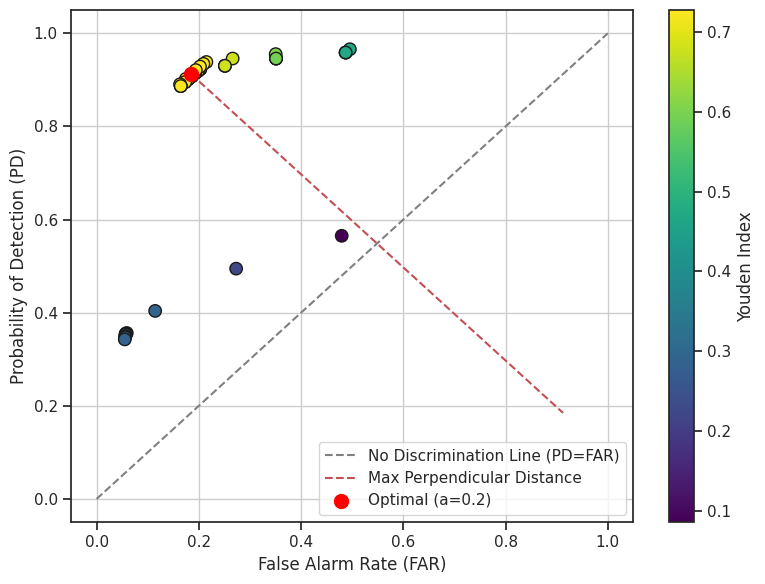

In [56]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_pd_vs_far_with_optimal_point(agg_results):
    plt.figure(figsize=(8, 6))
    
    # Scatter plot
    scatter = plt.scatter(
        agg_results['FAR'], agg_results['PD'],
        c=agg_results['Youden_index'], cmap='viridis', s=80, edgecolor='k'
    )
    plt.colorbar(scatter, label='Youden Index')

    # Add diagonal reference line (line of no discrimination)
    x = np.linspace(0, 1, 100)
    plt.plot(x, x, color='gray', linestyle='--', label='No Discrimination Line (PD=FAR)')

    # Compute perpendicular distance from each point to the line y = x
    distances = np.abs(agg_results['PD'] - agg_results['FAR']) / np.sqrt(2)
    max_idx = distances.idxmax()
    optimal_row = agg_results.loc[max_idx]

    # Plot the optimal point and its perpendicular line to the diagonal
    optimal_far = optimal_row['FAR']
    optimal_pd = optimal_row['PD']
    plt.plot([optimal_far, optimal_pd], [optimal_pd, optimal_far], 'r--', label='Max Perpendicular Distance')
    plt.scatter(optimal_far, optimal_pd, color='red', s=100, zorder=5, label=f"Optimal (a={np.round(optimal_row['a'],3)})")

    # Labels and grid
    plt.xlabel('False Alarm Rate (FAR)')
    plt.ylabel('Probability of Detection (PD)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plot_pd_vs_far_with_optimal_point(agg_results)
